In [1]:
# import required libraries to munge data
import pandas as pd
import numpy as np
import os

In [2]:
# import matplotlib to draw plot inside of notebook
%matplotlib inline
from mpl_toolkits.mplot3d.axes3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm

In [3]:
# Start from grid table
grid_table = pd.read_csv("../../log/revised-20epochs.csv", header=0)
grid_table.describe()

/usr/local/lib/python2.7/dist-packages/numpy/lib/function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


,Msec,Step,Epoch,Elapsed Time,Test Error,Validation Error,Training Error,FILTER_SIZE,CONV1_KERNELS,CONV2_KERNELS,FC1_UNITS
count,86505.000000,86505.000000,86505.000000,86505.000000,86505.000000,86505.000000,0.0,86505.000000,86505.000000,86505.000000,86505.000000
mean,499.241755,9395.745078,10.938004,550.918331,0.434168,0.431153,NaN,6.962869,274.986995,275.076007,569.472377
std,288.783695,5135.520337,5.978487,532.835247,0.439196,0.440372,NaN,2.810832,143.494909,143.293546,293.498936
min,0.000000,859.000000,1.000000,7.960000,0.005200,0.000000,NaN,3.000000,50.000000,50.000000,128.000000
25%,249.000000,5154.000000,6.000000,173.000000,0.009300,0.003800,NaN,5.000000,150.000000,150.000000,256.000000
50%,499.000000,9449.000000,11.000000,376.000000,0.029100,0.033400,NaN,7.000000,300.000000,250.000000,512.000000
75%,748.000000,13744.000000,16.000000,746.000000,0.897200,0.895600,NaN,9.000000,400.000000,400.000000,768.000000
max,999.000000,17180.000000,20.000000,3750.000000,0.904200,0.897400,NaN,11.000000,500.000000,500.000000,1024.000000


In [4]:
from math import log
def log_scale(list, base=2):
    """apply log2 function to all list item"""
    for i in range(len(list)):
        list[i] = log(list[i], base)
    return list

In [5]:
def select_case(table, kv):
    subset_table = table
    for k in kv:
        subset_table = subset_table[subset_table[k] == kv[k]]
       
    return (subset_table)    

In [6]:
def create_subset_table(grid_table, measureType):
    
    subset_table = grid_table[grid_table["Measure Type"] == measureType]
    
    subset_table = pd.DataFrame(subset_table[["Step", "Epoch", "FILTER_SIZE", "CONV1_KERNELS", "CONV2_KERNELS", "FC1_UNITS", "Elapsed Time", "Test Error"]])
    subset_table = subset_table.sort_values(["Step", "FILTER_SIZE", "CONV1_KERNELS", "CONV2_KERNELS", "FC1_UNITS"], \
                                                    ascending=[True, True, True, True, True])
    subset_table = subset_table.reset_index(drop=True)

    #subset_table.describe()
    return subset_table

In [38]:
def create_best_error_table(best_list, total_only_table):
    merged_list = []
    no_total_list = []
    for best_condition in best_list:
        selection = {"FILTER_SIZE": best_condition["FILTER_SIZE"],\
                     "CONV1_KERNELS" : best_condition["CONV1_KERNELS"],\
                     "CONV2_KERNELS" : best_condition["CONV2_KERNELS"],\
                     "FC1_UNITS" : best_condition["FC1_UNITS"]}
        row = select_case(total_only_table, selection)        
        items = row.values.tolist()
        
        if len(items) >= 1:            
            item = items[0]            
            best_condition["Elapsed Time"] = row["Elapsed Time"].values.tolist()[0]
            best_condition["Epoch"] = row["Epoch"].values.tolist()[0]
            best_condition["Step"] = row["Step"].values.tolist()[0] 
            if item[5] > best_condition["Best Test Error"]:
                best_condition["Best Test Error"] = row["Test Error"].values.tolist()[0]  
        else:
            # print str(best_condition) # print out missing conditions in total_only_table 
            no_total_list.append(best_condition)
        merged_list.append(best_condition)
    merged_table = pd.DataFrame(merged_list)
    #merged_table.head(10)
    return [merged_table, no_total_list]

In [8]:
# Extract an one dimension
def get_one_dim(table, kv, selected_dim, output, log_x=True, log_y= True, plot=False):
    subset_table = table
    x_col = selected_dim
    for k in kv:
        subset_table = subset_table[subset_table[k] == kv[k]]
    
    if log_x: # log 2 transformation
        logscale_x = "log2(" + selected_dim + ")"
        subset_table[logscale_x] = log_scale(subset_table[selected_dim].values.tolist())
        x_col = logscale_x

    if log_y:  # log 10 transformation
        logscale_y = "log10(" + output + ")"
        subset_table[logscale_y] = log_scale(subset_table[output].values.tolist(), 10)
        output = logscale_y
        
    if plot:
        subset_table.plot(x=x_col, y=[output], figsize=(8, 8))
        
    return (subset_table)

In [9]:
def create_best_error_list(grid_table):
    # munge table to record best accuracy of hyperparameter vector which measured at each epochs
    epoch_table = grid_table[grid_table["Measure Type"] == "epoch"]

    best_list = []
    filter_sizes = set(grid_table['FILTER_SIZE'].values.tolist()) 
    conv1_depths = set(grid_table['CONV1_KERNELS'].values.tolist()) 
    conv2_depths = set(grid_table['CONV2_KERNELS'].values.tolist()) 
    fc_depths = set(grid_table['FC1_UNITS'].values.tolist()) 
    missing_list = []
    for filter_size in filter_sizes:
        for conv1_depth in conv1_depths:
            for conv2_depth in conv2_depths:
                for fc_depth in fc_depths:
                    selection = {"FILTER_SIZE": filter_size, "CONV1_KERNELS" : conv1_depth, \
                                 "CONV2_KERNELS" : conv2_depth, "FC1_UNITS" : fc_depth}
                    case = select_case(epoch_table, selection)
                    if len(case) == 0:
                        #print "missing case: " + str(selection)
                        missing_list.append(selection)
                    else:
                        best_test_error =  min(case["Test Error"])
                        best_case_row = case[case["Test Error"] == best_test_error]
                        epoch = best_case_row["Epoch"].tail(1).values.tolist()[0]
                        elapsed_time = best_case_row["Elapsed Time"].tail(1).values.tolist()[0]
                        best_case = {"FILTER_SIZE" : filter_size, "CONV1_KERNELS": conv1_depth, \
                                 "CONV2_KERNELS" : conv2_depth, "FC1_UNITS" : fc_depth, \
                                     "Best Test Error" : best_test_error,\
                                    "Epoch" : epoch, "Elapsed Time" : elapsed_time}
                        best_list.append(best_case)
    
    return [best_list, missing_list]

In [10]:
best_list, missing_list = create_best_error_list(grid_table)
print "number of HPVs: " + str(len(best_list))
print "number of missing HPVs: " + str(len(missing_list))

number of HPVs: 4000
number of missing HPVs: 0


In [39]:
total_only_table = create_subset_table(grid_table, "total")
best_only_table, missing_totals = create_best_error_table(best_list, total_only_table)
for missing_total in missing_totals:
    print missing_total

{'Elapsed Time': 1740.0, 'CONV1_KERNELS': 250, 'Epoch': 19.0, 'FILTER_SIZE': 11, 'CONV2_KERNELS': 500, 'Best Test Error': 0.88649999999999995, 'FC1_UNITS': 896}
{'Elapsed Time': 1150.0, 'CONV1_KERNELS': 400, 'Epoch': 19.0, 'FILTER_SIZE': 9, 'CONV2_KERNELS': 200, 'Best Test Error': 0.88649999999999995, 'FC1_UNITS': 384}
{'Elapsed Time': 935.0, 'CONV1_KERNELS': 400, 'Epoch': 19.0, 'FILTER_SIZE': 9, 'CONV2_KERNELS': 150, 'Best Test Error': 0.88649999999999995, 'FC1_UNITS': 128}
{'Elapsed Time': 2000.0, 'CONV1_KERNELS': 500, 'Epoch': 19.0, 'FILTER_SIZE': 9, 'CONV2_KERNELS': 300, 'Best Test Error': 0.88649999999999995, 'FC1_UNITS': 640}
{'Elapsed Time': 2340.0, 'CONV1_KERNELS': 500, 'Epoch': 19.0, 'FILTER_SIZE': 9, 'CONV2_KERNELS': 350, 'Best Test Error': 0.88649999999999995, 'FC1_UNITS': 128}
{'Elapsed Time': 1380.0, 'CONV1_KERNELS': 350, 'Epoch': 19.0, 'FILTER_SIZE': 9, 'CONV2_KERNELS': 300, 'Best Test Error': 0.88649999999999995, 'FC1_UNITS': 256}
{'Elapsed Time': 846.0, 'CONV1_KERNELS':

In [53]:
import numpy as np
import matplotlib.pyplot as plt

def draw_box_plots(table, selected_dim, output):
    fig = plt.figure(num=None, figsize=(25, 10), dpi=100, facecolor='w', edgecolor='k')
    
    ax = fig.add_subplot(111)
    x_values = sorted(set(table[selected_dim]))
    box_list = []
    selection = {}    
    for x_value in x_values:
        selection[selected_dim] = x_value
        x = select_case(table, selection)
        x = x[output].values.tolist()
        box_list.append(x)
    
    ax.boxplot(box_list)
    ax.set_xticklabels(x_values, fontsize=20)
    plt.ylabel(output, fontsize=20)
    plt.xlabel(selected_dim, fontsize=20)
    plt.show()

In [41]:
best_only_table.describe()

,Best Test Error,CONV1_KERNELS,CONV2_KERNELS,Elapsed Time,Epoch,FC1_UNITS,FILTER_SIZE,Step
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,3986.0
mean,0.430211,275.000000,275.000000,1009.666775,19.984000,576.000000,7.000000,17180.0
std,0.440509,143.632021,143.632021,711.003335,0.410227,293.321512,2.828781,0.0
min,0.005400,50.000000,50.000000,63.100000,2.000000,128.000000,3.000000,17180.0
25%,0.007700,150.000000,150.000000,466.750000,20.000000,352.000000,5.000000,NaN
50%,0.012450,275.000000,275.000000,788.000000,20.000000,576.000000,7.000000,NaN
75%,0.886500,400.000000,400.000000,1390.000000,20.000000,800.000000,9.000000,NaN
max,0.902000,500.000000,500.000000,3750.000000,20.000000,1024.000000,11.000000,17180.0


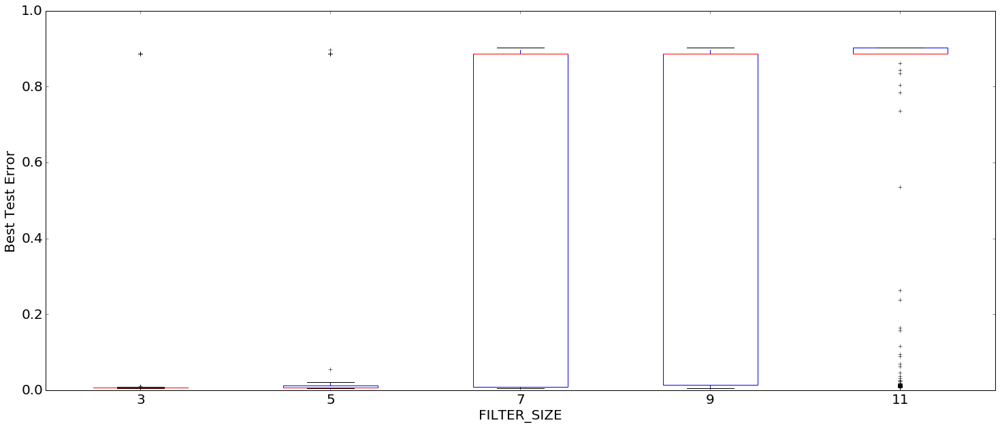

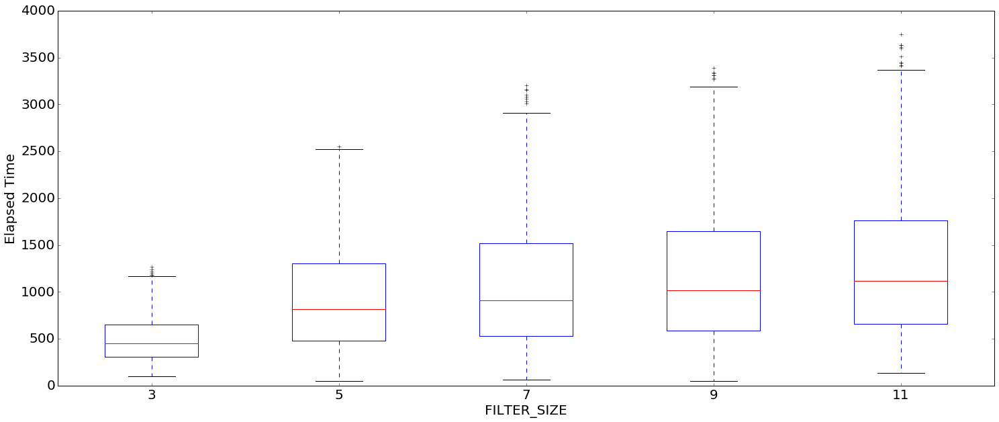

In [54]:
selected_dim = "FILTER_SIZE"
draw_box_plots(best_only_table, selected_dim, "Best Test Error")
draw_box_plots(best_only_table, selected_dim, "Elapsed Time")

In [21]:
import matplotlib
import matplotlib.transforms as transforms

# set global font size
font = {'size'   : 20}
matplotlib.rc('font', **font)

def draw_summary_plot(table, selected_dim, title, output = "Best Test Error", figsize=(20, 25)):
    
    fig = plt.figure(num=None, figsize=figsize, dpi=100, facecolor='w', edgecolor='k')
    #fig.suptitle(title, fontsize=30)
    
    x_values = sorted(set(table[selected_dim]))
    error_box_list = []
    best_error_list = []
    time_box_list = []
    selection = {}
    best_time_list = []
    for x_value in x_values:
        selection[selected_dim] = x_value
        #print selection
        x = select_case(table, selection)
        #print len(x[output])
        
        best_error_value = min(x[output])
        
        #if len(best_error_list) == 0: # if list is empty, write twice
        #    best_error_list.append(best_error_value)
        best_error_list.append(best_error_value)
        
        #print x[output]
        # find the appropriate elapsed time
        time_box_values = x["Elapsed Time"].values.tolist()
        time_box_list.append(time_box_values)

        best_time = x[x[output] == best_error_value]["Elapsed Time"]        
        best_time = best_time.values[0]
        #if len(best_time_list) == 0: # if list is empty, write twice
        #    best_time_list.append(best_time)
        best_time_list.append(best_time)
        
        error_box_values = x[output].values.tolist()
        logscale_box = log_scale(error_box_values, 10)        
        error_box_list.append(logscale_box)
    
    #print(len(time_box_list))
    #print(len(box_list))
    subplot = fig.add_subplot(211)
    subplot.boxplot(error_box_list) # test error box plot

    subplot2 = subplot.twinx()
    subplot.set_ylim([log(0.005, 10), log(1, 10)]) # 0 - 1 scale
    subplot.set_yticklabels([])
    #print(x_values)
    #print(best_list)

    subplot2.semilogy(range(1, 1+len(best_error_list)), best_error_list, color="black", linestyle='--', marker='o', label="Best Test Error")
    subplot2.grid(True)
    subplot2.set_ylim([0.005, 1]) # 0 - 1 scale
    subplot.set_xticklabels(x_values)
    subplot.set_xlim([0, len(x_values) + 1])
    plt.ylabel(output)
    
    plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, borderaxespad=0)
    
    subplot3 = fig.add_subplot(212)
    subplot3.plot(range(1, 1+len(best_time_list)), best_time_list, color="black", linestyle='--', marker='o', label="Training Time of Best Test Error")
    
    #subplot4 = subplot3.twinx()
    subplot3.boxplot(time_box_list)
    subplot3.set_xlim([0, len(x_values) + 1])
    
    subplot3.set_xticklabels([])
    
    #print(x_values)
    
    subplot.xaxis.grid()
    #subplot.yaxis.grid()
    subplot3.xaxis.grid()
    subplot3.yaxis.grid()
    
    plt.ylabel("Elapsed Time")
    plt.xlabel(selected_dim)
    plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, borderaxespad=0)    
    file_name = title + ".png"
    file_name = file_name.replace(" ", "_")
    fig.savefig("epoch_20/" + file_name, format='png', dpi=100, show=False, bbox_inches='tight')
    plt.show()

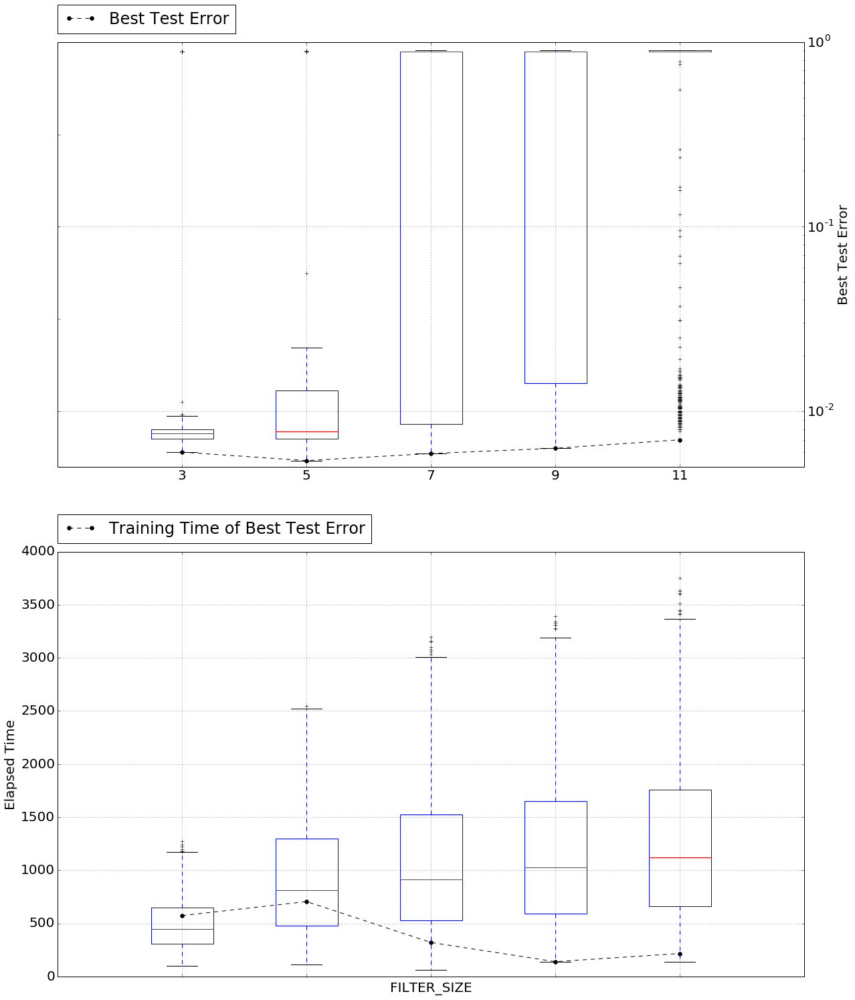

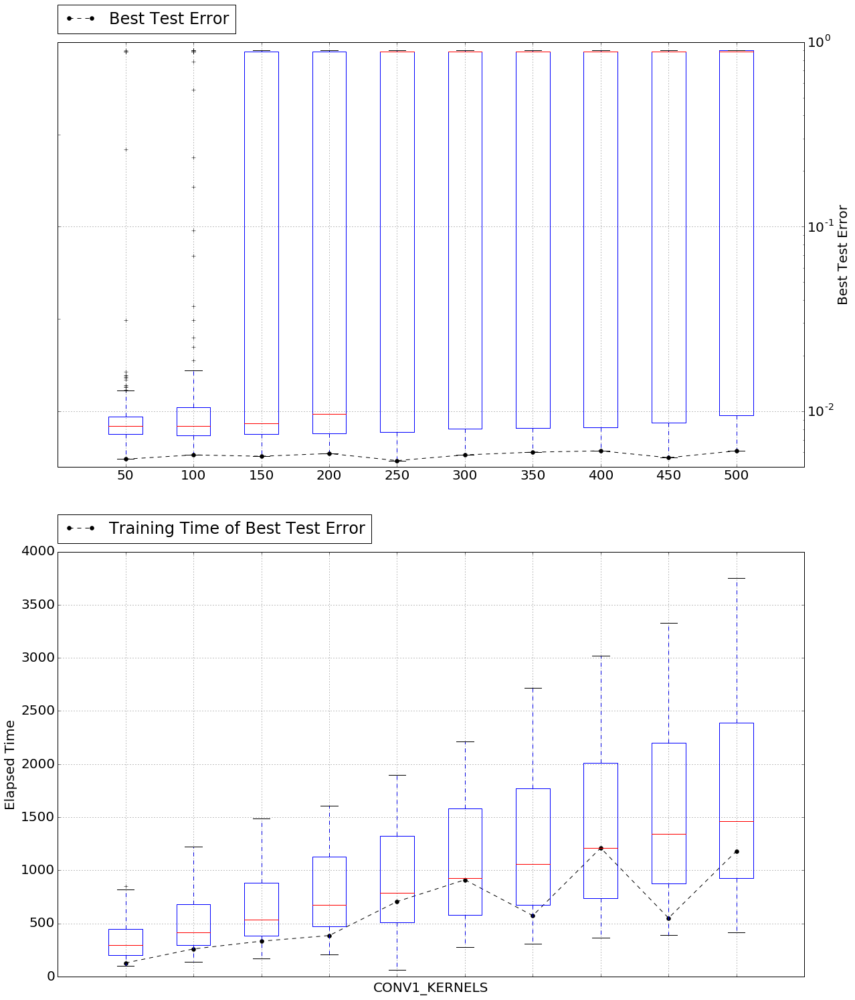

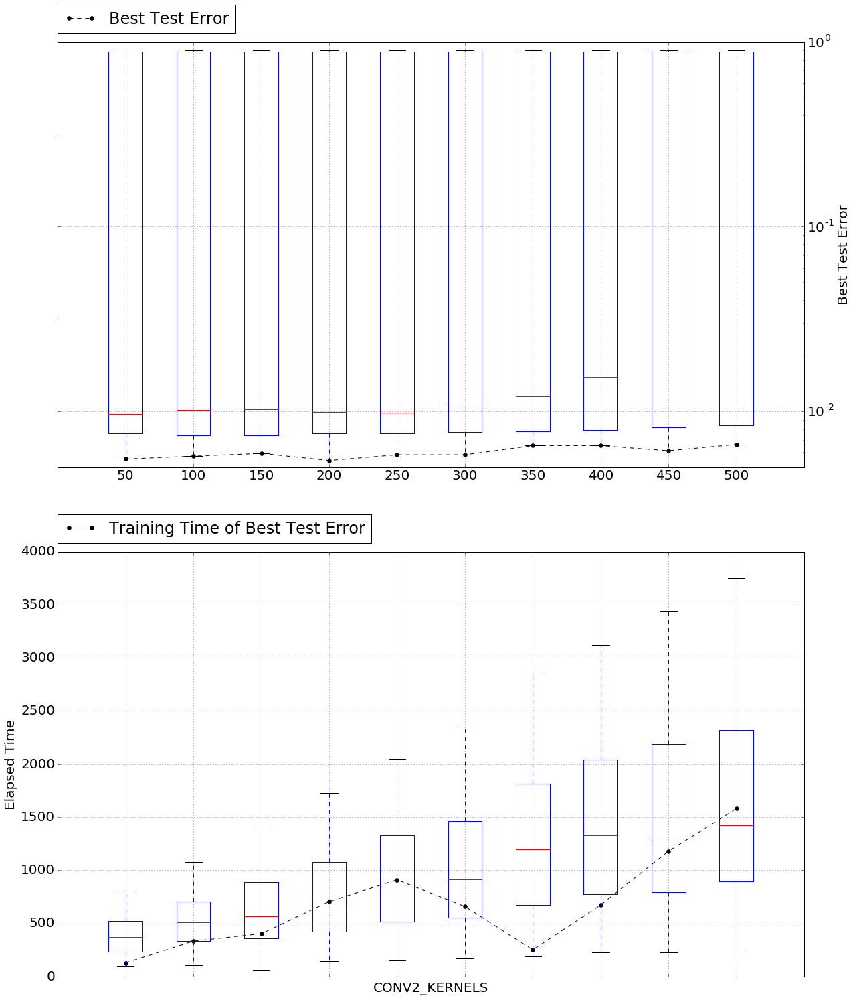

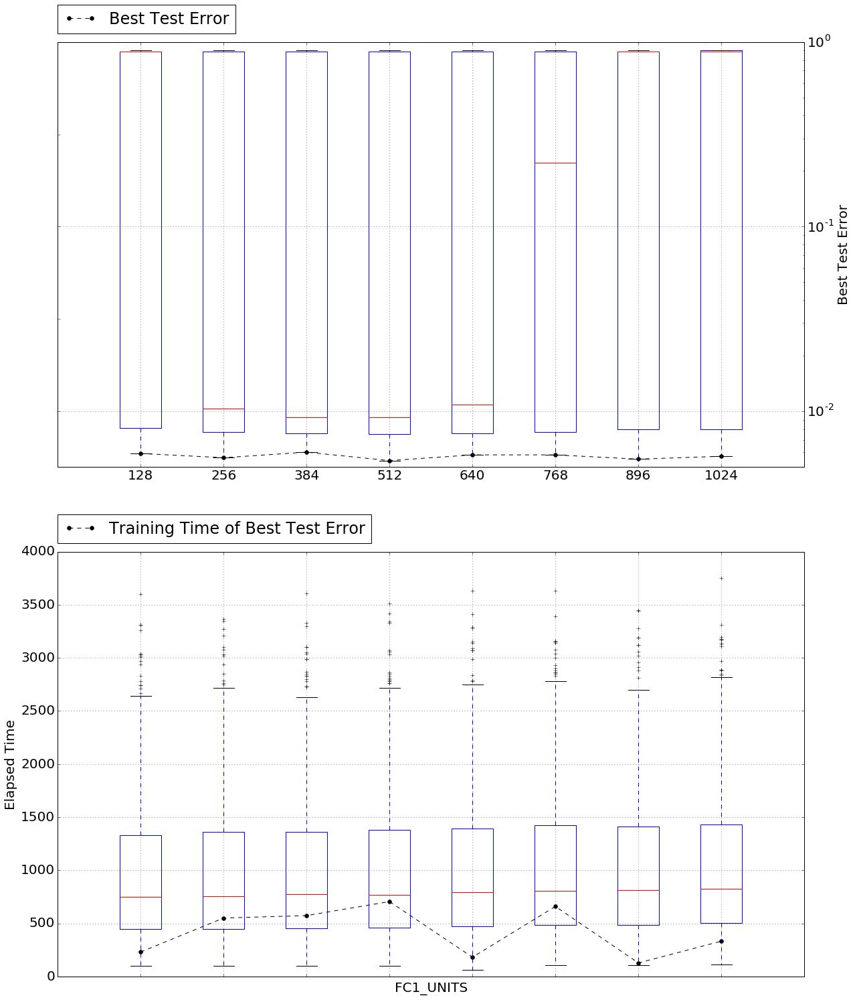

In [22]:
selected_dims = ["FILTER_SIZE", "CONV1_KERNELS", "CONV2_KERNELS", "FC1_UNITS"]
for selected_dim in selected_dims:
    draw_summary_plot(best_only_table, selected_dim, "Error and time distribution at each " + selected_dim + " (within 20 epoches)")

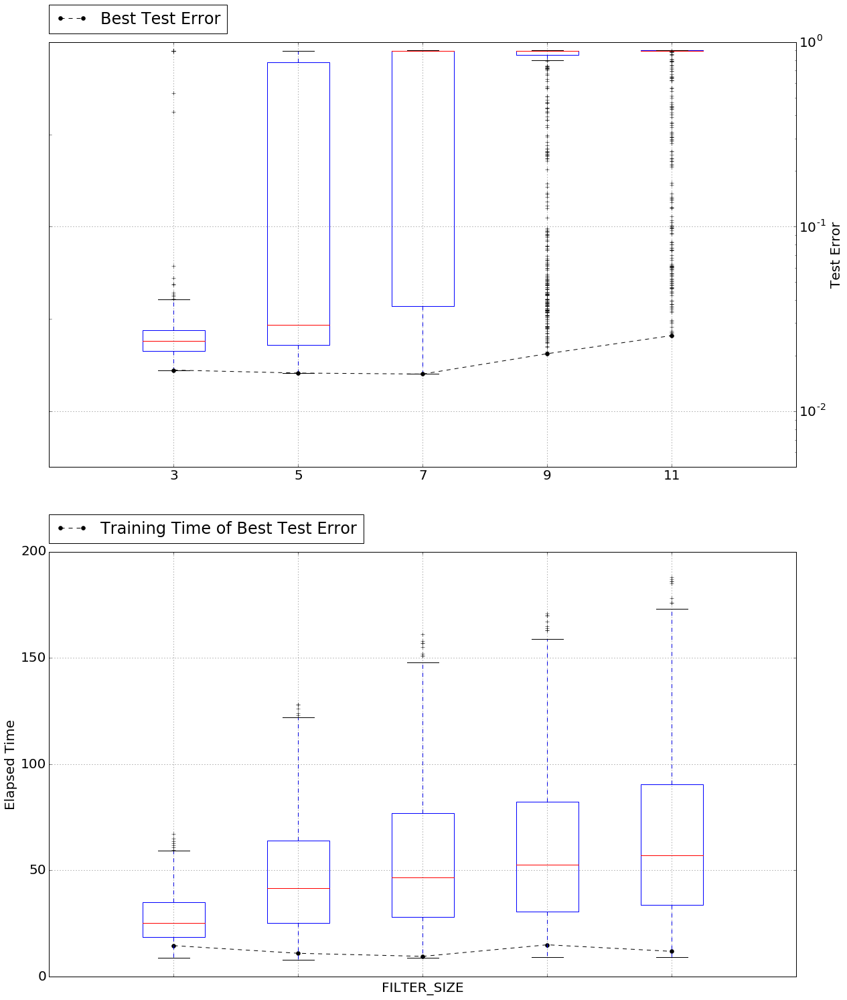

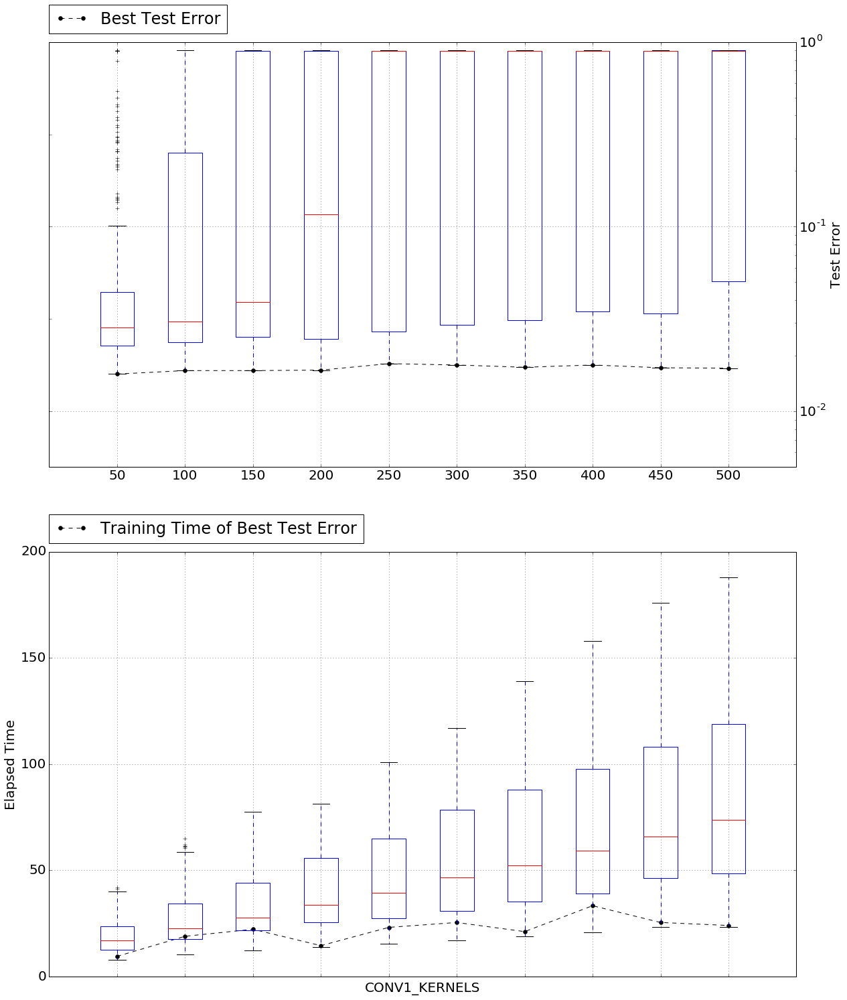

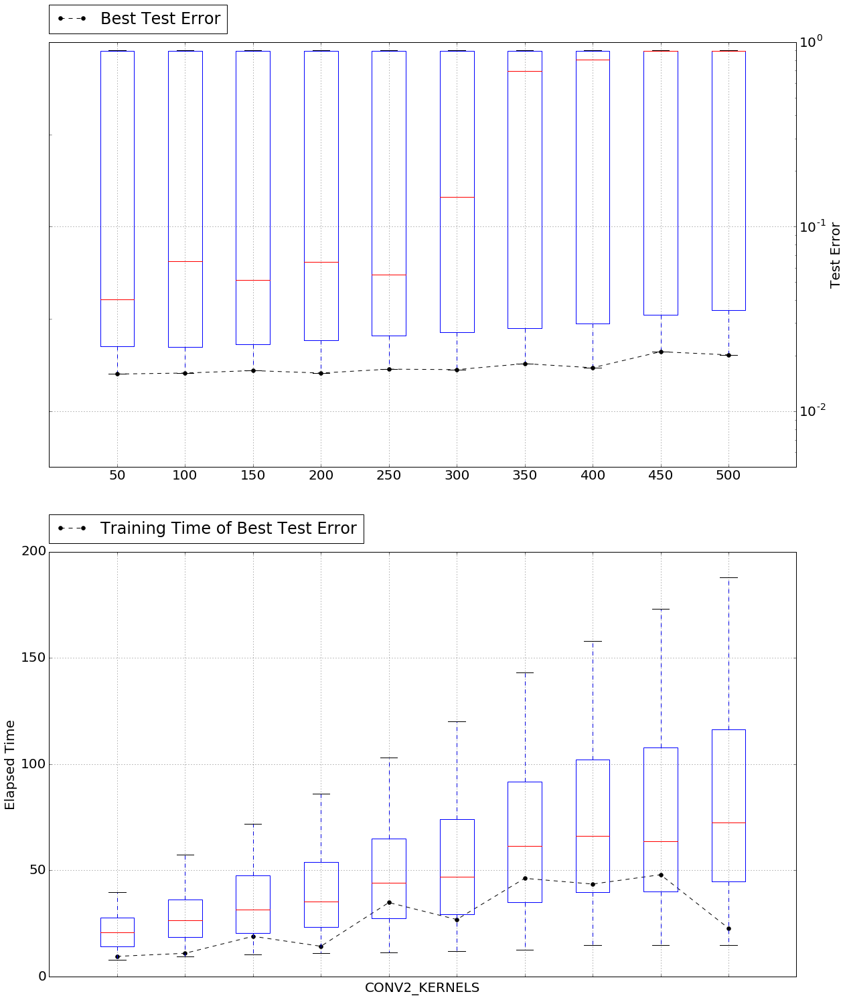

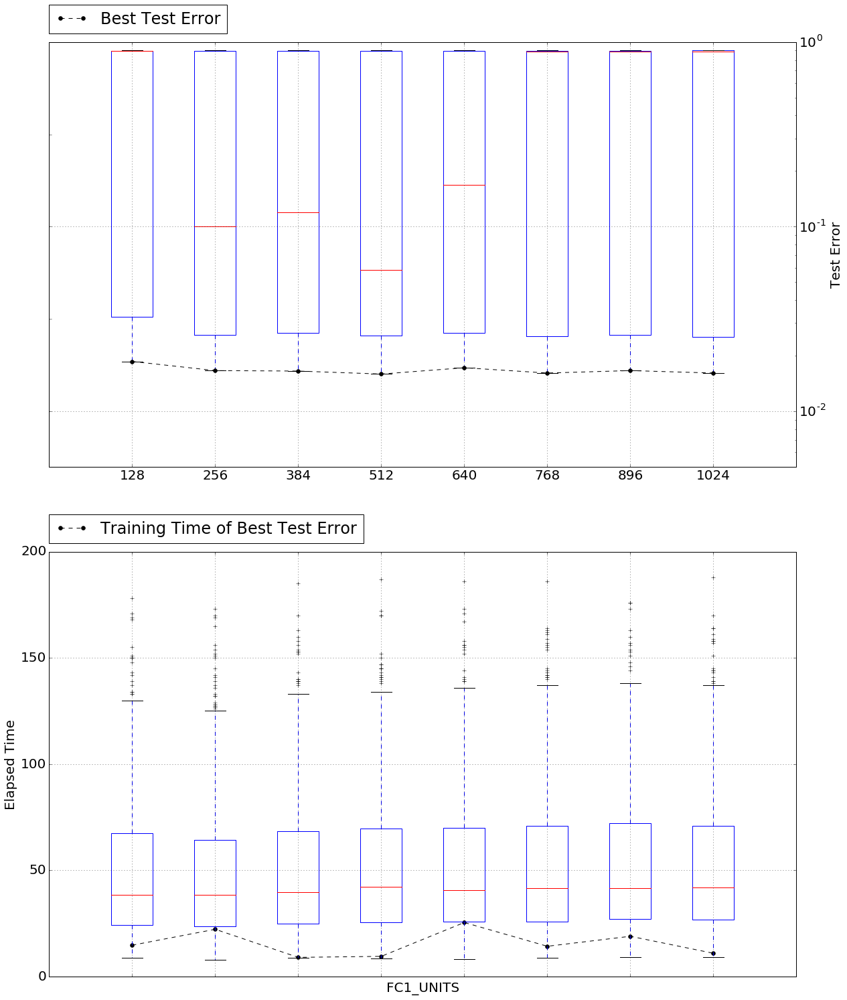

In [24]:
epoch_table = create_subset_table(grid_table, "epoch")
epoch_1_table = epoch_table[epoch_table["Epoch"] == 1.00]

for selected_dim in selected_dims:
    draw_summary_plot(epoch_1_table, selected_dim, "Error and time distribution at each " + selected_dim + " (1 epoch only)", output = "Test Error")

In [25]:
# find the distribution of best test error in each epochs
best_error_list = []

filter_sizes = set(grid_table["FILTER_SIZE"].values.tolist()) 
conv1_depths = set(grid_table["CONV1_KERNELS"].values.tolist()) 
conv2_depths = set(grid_table["CONV2_KERNELS"].values.tolist()) 
fc_depths = set(grid_table["FC1_UNITS"].values.tolist()) 

for filter_size in filter_sizes:
    for conv1_depth in conv1_depths:
        for conv2_depth in conv2_depths:
            for fc_depth in fc_depths:
                selection = {"FILTER_SIZE": filter_size, "CONV1_KERNELS" : conv1_depth, \
                             "CONV2_KERNELS" : conv2_depth, "FC1_UNITS" : fc_depth}
                case = select_case(epoch_table, selection)
                if len(case["Test Error"]) > 0:
                    epoch_best = case[case["Test Error"] == min(case["Test Error"])]["Epoch"]
                    epoch_best = epoch_best.values.tolist()[0]
                    epoch_num = int(epoch_best)
                    best_error_list.append(epoch_num)

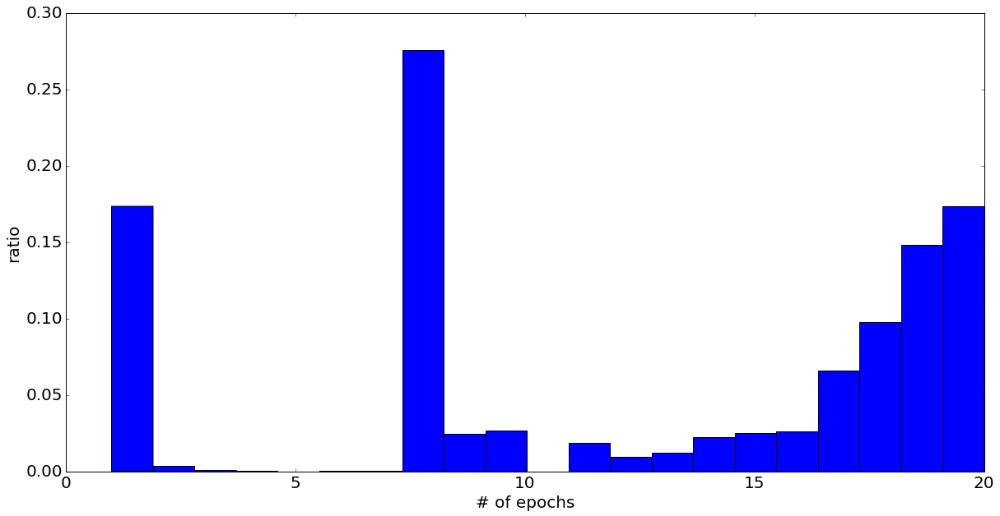

In [26]:
fig = plt.figure(num=None, figsize=(20, 10), dpi=100, facecolor='w', edgecolor='k')
#fig.suptitle("The number of epoch when best test error achieved", fontsize=30)
subplot = fig.add_subplot(1, 1, 1)

subplot.hist(best_error_list, 21, normed=True)
plt.xlabel("# of epochs")
plt.ylabel("ratio")
fig.savefig("epoch_20/20epochs_for_best.png", format='png', dpi=200, show=False, bbox_inches='tight')
plt.show()

In [ ]:
# modified version (Test Error is transformated by log 10 scale)
def draw_n_by_n_plots(table, fixed, x_axis, y_axis, selected_dim, output, show_fig=False, save_fig=True):
    condition = {}
    condition[fixed["name"]] = fixed["value"]

    fig = plt.figure(num=None, figsize=(50, 50), dpi=200, facecolor='w', edgecolor='k')
    fig.suptitle("Fixed hyperparameter - " + fixed["name"] + ": " + str(fixed["value"]), fontsize=30)
    fig_index = 1
    
    if output == "Elapsed Time":
        # for fixed output range setting
        condition[x_axis["name"]] = max(x_axis["values"])
        condition[y_axis["name"]] = max(y_axis["values"])
        
        one_dim_table = get_one_dim(table, condition, selected_dim, output)
        output_table = one_dim_table[output]
        if len(output_table) == 0:
            max_y = 1
        else:
            max_y = max(output_table)
        y_range = [0, max_y] 
        y_col_name = output
    elif output == "Test Error":
        y_range = [log(0.001, 10), log(1, 10)] # 0 - 1 scale
        y_col_name = "log10(" + output + ")"
    else:
        print("unsupported output type")
    
    x_axis_length = len(x_axis["values"])
    y_axis_length = len(y_axis["values"])
    
    for i in range(x_axis_length):
        condition[x_axis["name"]] = x_axis["values"][i]
        for j in range(y_axis_length):
            subplot = fig.add_subplot(x_axis_length, y_axis_length, fig_index)
            fig_index += 1
            condition[y_axis["name"]] = y_axis["values"][j]
            
            one_dim_table = get_one_dim(table, condition, selected_dim, output)             
            x_col_name = selected_dim
                
            subplot.plot(one_dim_table[x_col_name], one_dim_table[y_col_name])
            title = x_axis["name"] + ":" + str(condition[x_axis["name"]]) + ", " + \
                y_axis["name"] + ":" + str(condition[y_axis["name"]])
            subplot.set_title(title)
            subplot.set_ylim(y_range)
            if j == 0:
                plt.ylabel(y_col_name)

            if j == 0:
                plt.xlabel(x_col_name)

    if show_fig:
        plt.show()
    if save_fig:
        working_dir = os.getcwd()
        file_name = fixed["name"] + "_" + str(condition[fixed["name"]]) + '-' + output + '.png'
        file_name = file_name.replace(" ", "_")
        output_folder = output.replace(" ", "_")
        selected_dim_folder = selected_dim.replace(" ", "_")
        
        try:
            os.chdir("epoch_20") # for 20 epochs
            if not os.path.exists(output_folder):
                os.makedirs(output_folder)
                print(output_folder + " is created")
                
            os.chdir(output_folder)

            if not os.path.exists(selected_dim_folder):
                os.makedirs(selected_dim_folder)
                
            os.chdir(selected_dim_folder)
        except OSError as exception:
            print("folder creation error: " + str(exception))
            os.chdir(working_dir)
            
        fig.savefig(file_name, format='png', dpi=100, show=False, bbox_inches='tight')
        os.chdir(working_dir)
        print(file_name + " is saved successfully.")
        
    return

In [64]:
# analysis for epoch status
best_only_table = pd.read_csv("../../log/revised-best-summary.csv", header=0)
best_only_table.rename(columns={"Test Error": "Best Test Error"}, inplace=True)
num_epoch_to_analysis = 8.0
subset_table = best_only_table[best_only_table["Epoch"] == num_epoch_to_analysis]
#selected_dims = ["FILTER_SIZE", "CONV1_KERNELS", "CONV2_KERNELS", "FC1_UNITS"]
#draw_box_plots(subset_table, selected_dims[3], "Best Test Error")

In [46]:
subset_table.describe()

,Unnamed: 0,Msec,Step,Epoch,Elapsed Time,Best Test Error,Validation Error,Training Error,FILTER_SIZE,CONV1_KERNELS,CONV2_KERNELS,FC1_UNITS
count,997.000000,997.000000,997.0,997.0,997.000000,997.000000,997.000000,0.0,997.000000,997.000000,997.000000,997.000000
mean,2627.868606,524.200602,6872.0,8.0,1443.705115,0.886414,0.887116,NaN,8.329990,331.644935,318.555667,418.792377
std,787.075669,291.470882,0.0,0.0,638.667302,0.002610,0.002584,NaN,2.063362,116.977937,128.306549,278.034470
min,545.000000,0.000000,6872.0,8.0,206.000000,0.804100,0.805600,NaN,3.000000,50.000000,50.000000,128.000000
25%,2061.000000,288.000000,6872.0,8.0,958.000000,0.886500,0.887200,NaN,7.000000,250.000000,200.000000,128.000000
50%,2684.000000,523.000000,6872.0,8.0,1350.000000,0.886500,0.887200,NaN,9.000000,350.000000,350.000000,384.000000
75%,3302.000000,789.000000,6872.0,8.0,1860.000000,0.886500,0.887200,NaN,11.000000,450.000000,450.000000,640.000000
max,3996.000000,999.000000,6872.0,8.0,3630.000000,0.886500,0.887200,NaN,11.000000,500.000000,500.000000,1024.000000


In [52]:
best_only_table.describe()

,Unnamed: 0,Msec,Step,Epoch,Elapsed Time,Best Test Error,Validation Error,Training Error,FILTER_SIZE,CONV1_KERNELS,CONV2_KERNELS,FC1_UNITS
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,0.0,4000.000000,4000.000000,4000.000000,4000.000000
mean,1999.500000,509.299000,10598.986250,12.338750,1007.423825,0.429516,0.425591,NaN,7.000000,275.000000,275.000000,576.000000
std,1154.844867,286.896212,5800.533729,6.752659,710.727458,0.440545,0.442980,NaN,2.828781,143.632021,143.632021,293.321512
min,0.000000,0.000000,859.000000,1.000000,47.000000,0.005200,0.000000,NaN,3.000000,50.000000,50.000000,128.000000
25%,999.750000,267.000000,6872.000000,8.000000,465.750000,0.007500,0.001200,NaN,5.000000,150.000000,150.000000,352.000000
50%,1999.500000,507.000000,12026.000000,14.000000,785.000000,0.012000,0.004800,NaN,7.000000,275.000000,275.000000,576.000000
75%,2999.250000,761.000000,16321.000000,19.000000,1380.000000,0.886500,0.887200,NaN,9.000000,400.000000,400.000000,800.000000
max,3999.000000,999.000000,17180.000000,20.000000,3750.000000,0.902000,0.896000,NaN,11.000000,500.000000,500.000000,1024.000000


In [12]:
def select_partial_item(full_list):
    full_list.sort()
    result_list = []
    for i in range(len(full_list)):
        if i % 2 == 1:
            selected_item = full_list[i]
            result_list.append(selected_item)
    return result_list


In [13]:
filter_sizes = list(set(grid_table["FILTER_SIZE"].values.tolist()))
filter_sizes.sort()
conv1_depths = select_partial_item(list(set(grid_table["CONV1_KERNELS"].values.tolist()))) 
conv2_depths = select_partial_item(list(set(grid_table["CONV2_KERNELS"].values.tolist()))) 
fc_depths = select_partial_item(list(set(grid_table["FC1_UNITS"].values.tolist()))) 

In [ ]:
x_axis = {"name" : "CONV1_KERNELS", "values" : conv1_depths}
y_axis = {"name" : "CONV2_KERNELS", "values" : conv2_depths}
outputs = ["Elapsed Time", "Test Error"]
selected_dim = "FC1_UNITS"

for f in filter_sizes:
    for output in outputs:
        fixed = {"name": "FILTER_SIZE", "value": f}
        draw_n_by_n_plots(total_only_table, fixed, x_axis, y_axis, selected_dim, output, False, True)

In [ ]:
x_axis = {"name" : "CONV1_KERNELS", "values" : conv1_depths}
y_axis = {"name" : "CONV2_KERNELS", "values" : conv2_depths}
outputs = ["Elapsed Time", "Test Error"]
selected_dim = "FILTER_SIZE"

for fc in fc_depths:
    for output in outputs:
        fixed = {"name": "FC1_UNITS", "value": fc}
        draw_n_by_n_plots(total_only_table, fixed, x_axis, y_axis, selected_dim, output, False, True)

In [ ]:
x_axis = {"name" : "FILTER_SIZE", "values" : filter_sizes}
y_axis = {"name" : "FC1_UNITS", "values" : fc_depths}
outputs = ["Elapsed Time", "Test Error"]
selected_dim = "CONV1_KERNELS"

for conv2 in conv2_depths:
    for output in outputs:
        fixed = {"name": "CONV2_KERNELS", "value": conv2}
        draw_n_by_n_plots(total_only_table, fixed, x_axis, y_axis, selected_dim, output, False, True)

In [ ]:
x_axis = {"name" : "FILTER_SIZE", "values" : filter_sizes}
y_axis = {"name" : "FC1_UNITS", "values" : fc_depths}
outputs = ["Elapsed Time", "Test Error"]
selected_dim = "CONV2_KERNELS"

for conv1 in conv1_depths:
    for output in outputs:
        fixed = {"name": "CONV1_KERNELS", "value": conv1}
        draw_n_by_n_plots(total_only_table, fixed, x_axis, y_axis, selected_dim, output, False, True)

In [ ]:
print (missing_list)

In [14]:
source_table = pd.read_csv("../../log/revised-best-summary.csv", header=0)

In [15]:
def get_z_value(x_name, x_value, y_name, y_value, z_name, condition):
    condition[x_name] = x_value
    condition[y_name] = y_value
    #print condition
    result = select_case(source_table, condition) 
    return result[z_name].values[0]

In [16]:
print get_z_value("CONV1_KERNELS", 50, "CONV2_KERNELS", 50, "Test Error", {"FILTER_SIZE": 5, "FC1_UNITS": 512})

0.0059


In [18]:
def transform(data_list, n):
    x_list =[]
    y_list = []
    z_list = []
    for data in data_list:
        x_value = data[0]
        y_value = data[1]
        z_value = data[2]
        x_list.append(x_value)
        y_list.append(y_value)
        z_list.append(z_value)

#    print x_list
#    print y_list
#    print z_list

    X = [x_list[i:i+n] for i in range(0, len(x_list), n)]
    Y = [y_list[i:i+n] for i in range(0, len(y_list), n)]
    Z = [z_list[i:i+n] for i in range(0, len(z_list), n)]
#    print X
#    print Y
#    print Z
    return [X, Y, Z]

In [19]:
# generate data list
conv1_depths = list(set(source_table["CONV1_KERNELS"]))
conv1_depths.sort()        
conv2_depths = list(set(source_table["CONV2_KERNELS"]))
conv2_depths.sort()
filter_sizes = list(set(source_table["FILTER_SIZE"]))
filter_sizes.sort()        
fc1_widths = list(set(source_table["FC1_UNITS"]))
fc1_widths.sort()

In [20]:
def generate_data_list(x_key, x_values, y_key, y_values, z_key, condition):
    data_list = []
    for x in x_values:
        for y in y_values:            
            data = []
            data.append(x)
            data.append(y)

            if z_key == "Test Error":
                z = log(get_z_value(x_key, x, y_key, y, z_key, condition), 10)
            elif z_key == "Elapsed Time":
                z = get_z_value(x_key, x, y_key, y, z_key, condition) / 60 # per minutes
            else:
                z = get_z_value(x_key, x, y_key, y, z_key, condition)
            #print z
            data.append(z)
            data_list.append(data)
    return data_list

In [21]:
def generate_title(condition):
    title = ""
    for key in condition:
        if title != "":
            title = title + ", "
        title = title + str(key) + ": " + str(condition[key])
    return title

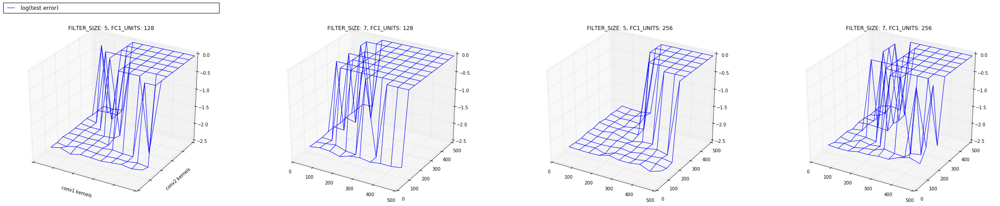

In [22]:
fig = plt.figure(figsize=(50, 70), dpi=200)
label='x: conv1 kernels, y: conv2 kernels, z: log(test error)'
#fig.suptitle(label)
index = 1

for fc1_width in [128, 256]:
    for filter_size in [5, 7]:
        condition = {"FC1_UNITS": fc1_width, "FILTER_SIZE": filter_size}
        ax = fig.add_subplot(len(fc1_widths), len(filter_sizes), index, projection='3d')

            
        ax.set_title(generate_title(condition))
        ax.set_xlim([0, max(conv1_depths)])
        ax.set_ylim([0, max(conv2_depths)])
        ax.set_zlim([-2.5, 0])
        X, Y, Z = transform(generate_data_list("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, "Test Error", condition), len(conv1_depths))
        ax.plot_wireframe(X, Y, Z, rstride=1, cstride=1, label = 'log(test error)')
        if index == 1:
            plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
            ax.set_xlabel('conv1 kernels')
            ax.set_xticklabels([])
            ax.set_ylabel('conv2 kernels')
            ax.set_yticklabels([])
        index += 1

plt.show()
fig.savefig("3dplot_conv1-conv2.png", format='png', dpi=300, show=False)

In [40]:
def draw_3dplots(x_key, x_values, y_key, y_values, col_key, col_values, row_key, row_values, z_key, postfix="", dpi=100, format='png'):
    fig = plt.figure(figsize=(len(col_values) * 10, len(row_values) * 10), dpi=dpi)
    #fig.suptitle("Test error variation when model capacity hyperparameter changes", fontsize=50)
    index = 1
    for row in row_values:
        for col in col_values:
            condition = {row_key: row, col_key: col}
            ax = fig.add_subplot(len(row_values), len(col_values), index, projection='3d')
            ax.set_title(generate_title(condition))
            ax.set_xlim([0, max(x_values)])
            ax.set_ylim([0, max(y_values)])
            #print condition
            X, Y, Z = transform(
                generate_data_list(x_key, x_values, y_key, y_values, z_key, condition), 
                len(y_values))
            
            if z_key == "Test Error":
                ax.set_zlim([-2.5, 0])
                label = 'log(test error)'
            elif z_key == "Elapsed Time":                
                max_value = 60 # TODO:how to find the appropriate max value?
                ax.set_zlim([0, max_value])
                label = 'training time (min.)'
            else:
                ax.set_zlim([0, 0])
                label = 'error'           
  
            ax.plot_wireframe(X, Y, Z, rstride=1, cstride=1, label=label)
            if index == 1:
                plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
                ax.set_xlabel(x_key)
                ax.set_xticklabels([])
                ax.set_ylabel(y_key)
                ax.set_yticklabels([])
            index += 1            

    plt.show()
    fig.savefig(z_key.replace(' ', '_') + "_3dplots_" + x_key + "-" + y_key + "-" + postfix + "." + format, \
                format=format, dpi=dpi, show=False, bbox_inches='tight')

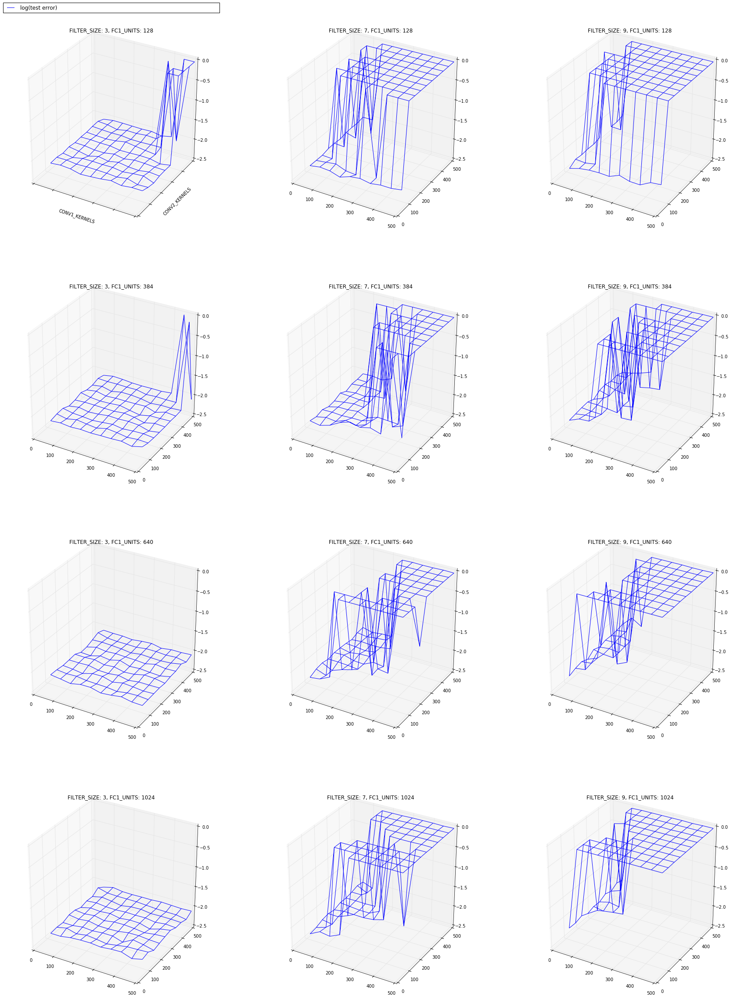

In [42]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, \
             "FILTER_SIZE", [3, 7, 9], "FC1_UNITS", [128, 384, 640, 1024], \
             "Test Error", postfix="partial", format='pdf')

In [ ]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, "FILTER_SIZE", filter_sizes, \
             "FC1_UNITS", [128, 256, 384, 512], "Test Error", postfix="1")

In [ ]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, "FILTER_SIZE", filter_sizes, \
             "FC1_UNITS", [640, 768, 896, 1024], "Test Error", postfix="2")

In [ ]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, "FILTER_SIZE", filter_sizes, \
             "FC1_UNITS", [128, 256, 384, 512], "Elapsed Time", postfix="1")
draw_3dplots("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, "FILTER_SIZE", filter_sizes, \
             "FC1_UNITS", [640, 768, 896, 1024], "Elapsed Time", postfix="2")

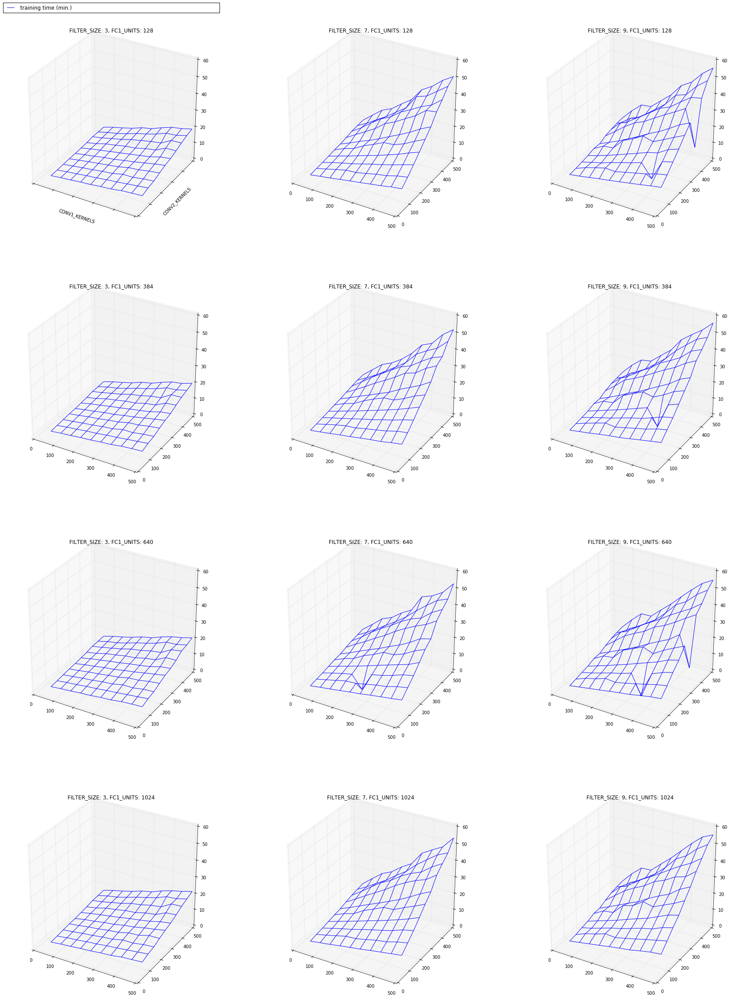

In [43]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "CONV2_KERNELS", conv2_depths, \
             "FILTER_SIZE", [3, 7, 9], "FC1_UNITS", [128, 384, 640, 1024], \
             "Elapsed Time", postfix="partial", format='pdf')

In [ ]:
draw_3dplots("CONV2_KERNELS", conv2_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV1_KERNELS", [50, 100, 150, 200, 250],"Test Error", postfix="1")
draw_3dplots( "CONV2_KERNELS", conv2_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV1_KERNELS", [300, 350, 400, 450, 500],"Test Error", postfix="2")

In [ ]:
draw_3dplots("CONV2_KERNELS", conv2_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV1_KERNELS", [50, 100, 150, 200, 250], "Elapsed Time", postfix="1")
draw_3dplots("CONV2_KERNELS", conv2_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV1_KERNELS", [300, 350, 400, 450, 500], "Elapsed Time", postfix="2")

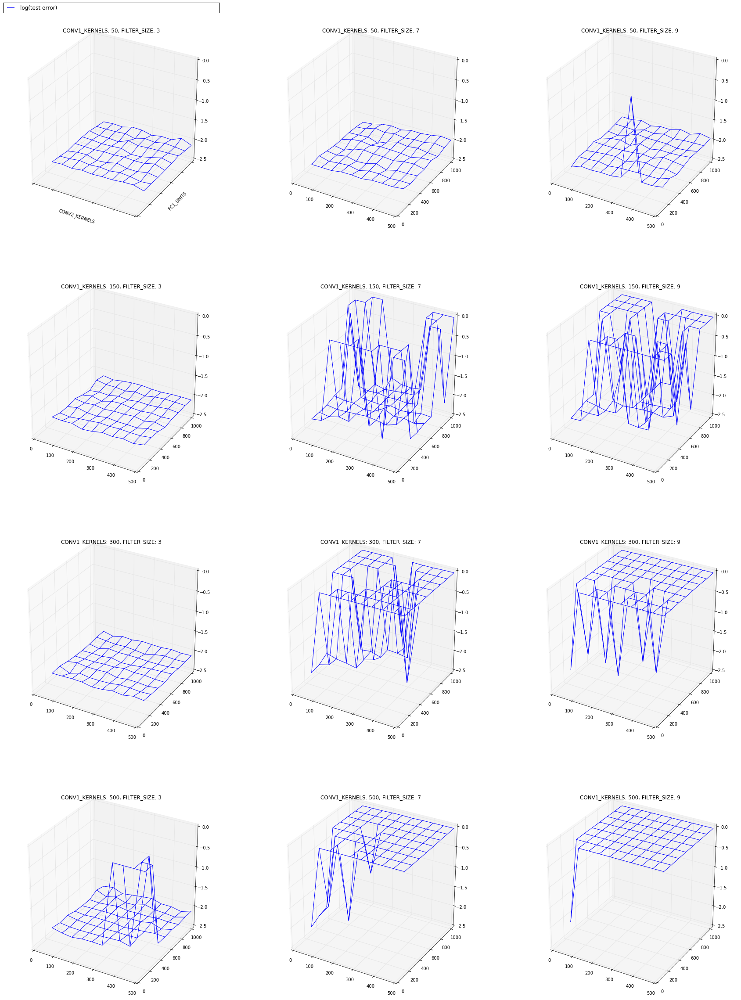

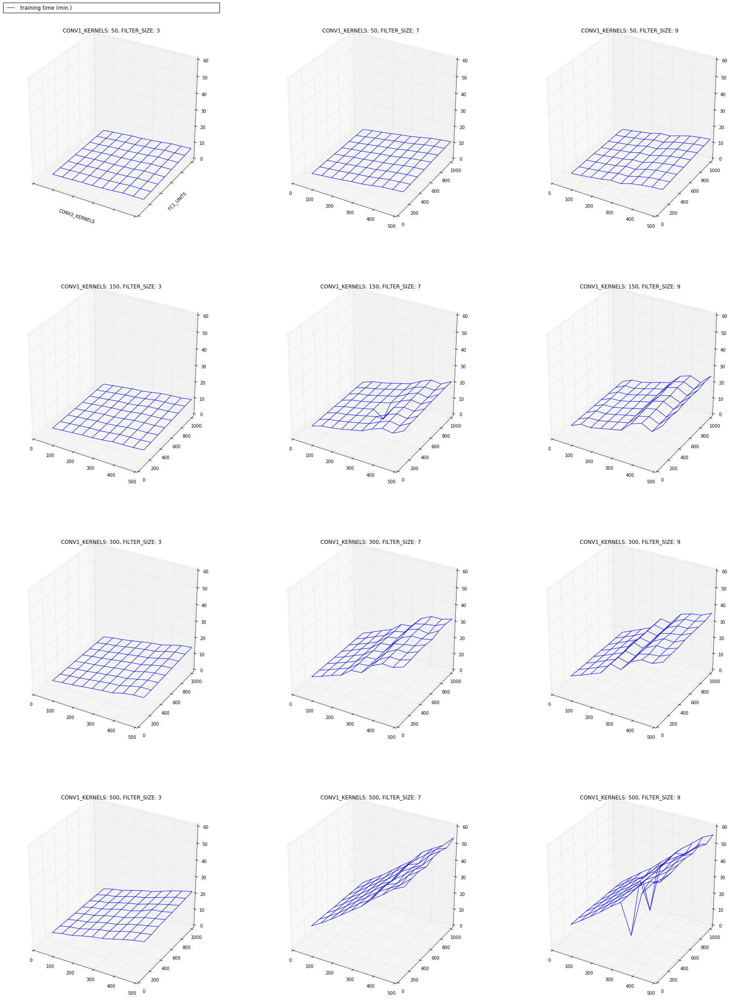

In [44]:
draw_3dplots("CONV2_KERNELS", conv2_depths, "FC1_UNITS", fc1_widths, \
             "FILTER_SIZE", [3, 7, 9], "CONV1_KERNELS", [50, 150, 300, 500], \
             "Test Error", postfix="partial", format='pdf')
draw_3dplots("CONV2_KERNELS", conv2_depths, "FC1_UNITS", fc1_widths, \
             "FILTER_SIZE", [3, 7, 9], "CONV1_KERNELS", [50, 150, 300, 500], \
             "Elapsed Time", postfix="partial", format='pdf')

In [ ]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV2_KERNELS", [50, 100, 150, 200, 250],"Test Error", postfix="1")
draw_3dplots( "CONV1_KERNELS", conv1_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV2_KERNELS", [300, 350, 400, 450, 500],"Test Error", postfix="2")

In [ ]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV2_KERNELS", [50, 100, 150, 200, 250],"Elapsed Time", postfix="1")
draw_3dplots( "CONV1_KERNELS", conv1_depths, "FC1_UNITS", fc1_widths, "FILTER_SIZE", filter_sizes, \
             "CONV2_KERNELS", [300, 350, 400, 450, 500],"Elapsed Time", postfix="2")

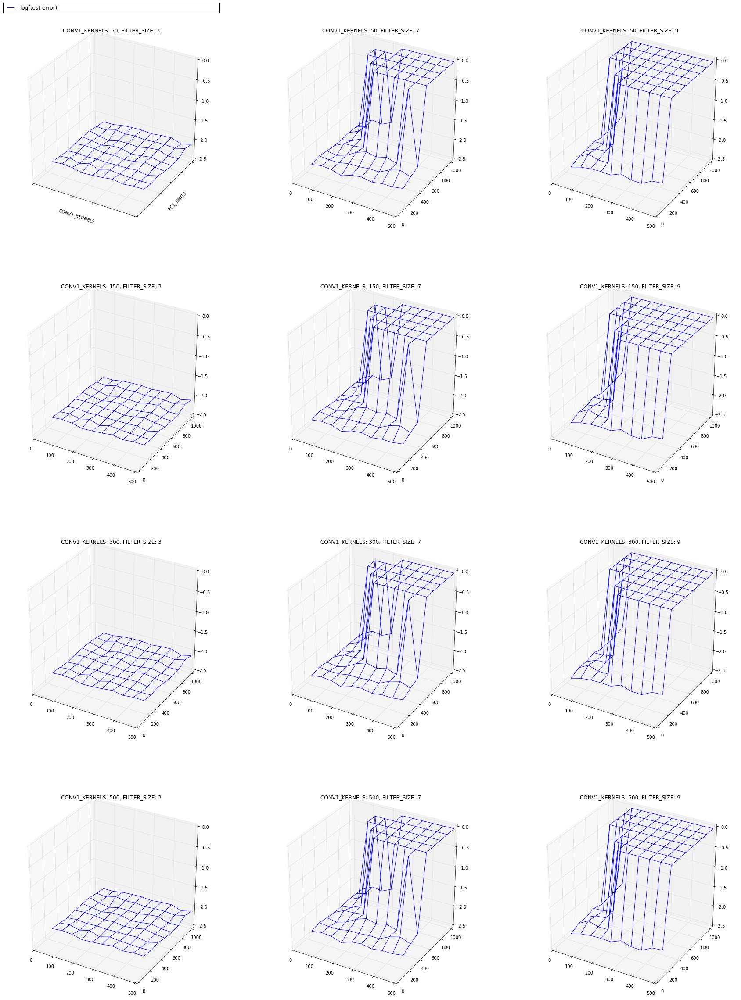

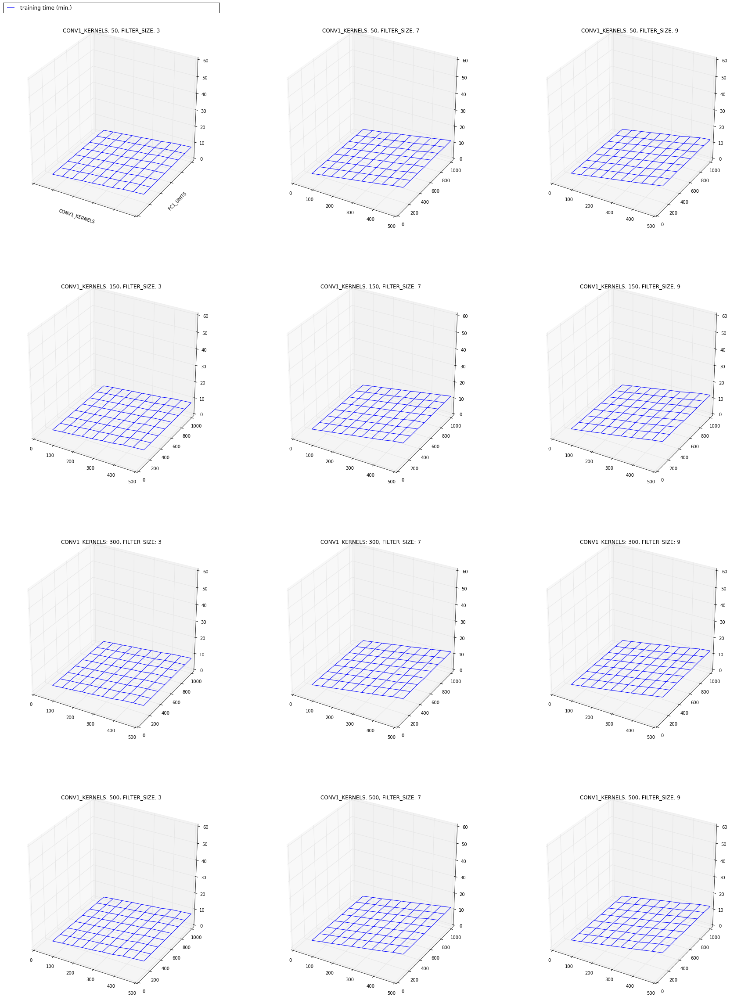

In [46]:
draw_3dplots("CONV1_KERNELS", conv1_depths, "FC1_UNITS", fc1_widths, \
             "FILTER_SIZE", [3, 7, 9], "CONV1_KERNELS", [50, 150, 300, 500], \
             "Test Error", postfix="partial", format='pdf')
draw_3dplots("CONV1_KERNELS", conv1_depths, "FC1_UNITS", fc1_widths, \
             "FILTER_SIZE", [3, 7, 9], "CONV1_KERNELS", [50, 150, 300, 500], \
             "Elapsed Time", postfix="partial", format='pdf')

In [ ]:
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV1_KERNELS", conv1_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV2_KERNELS", [50, 100, 150, 200, 250], \
             "Test Error", postfix="1")
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV1_KERNELS", conv1_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV2_KERNELS", [300, 350, 400, 450, 500],\
             "Test Error", postfix="2")
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV1_KERNELS", conv1_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV2_KERNELS", [50, 100, 150, 200, 250], \
             "Elapsed Time", postfix="1")
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV1_KERNELS", conv1_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV2_KERNELS", [300, 350, 400, 450, 500],\
             "Elapsed Time", postfix="2")

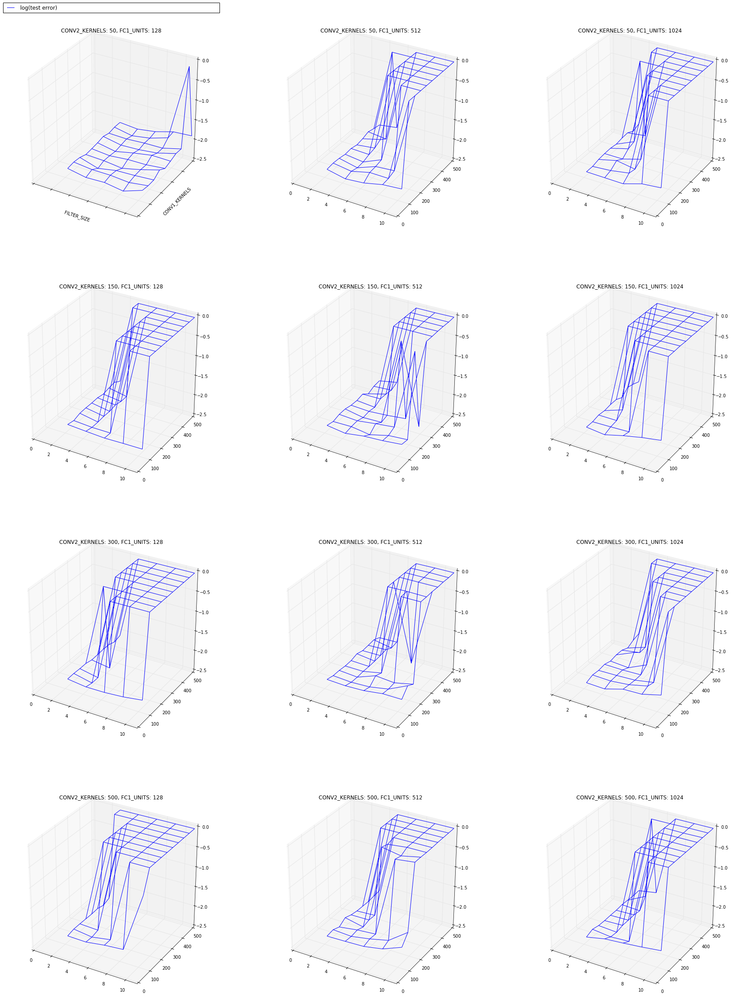

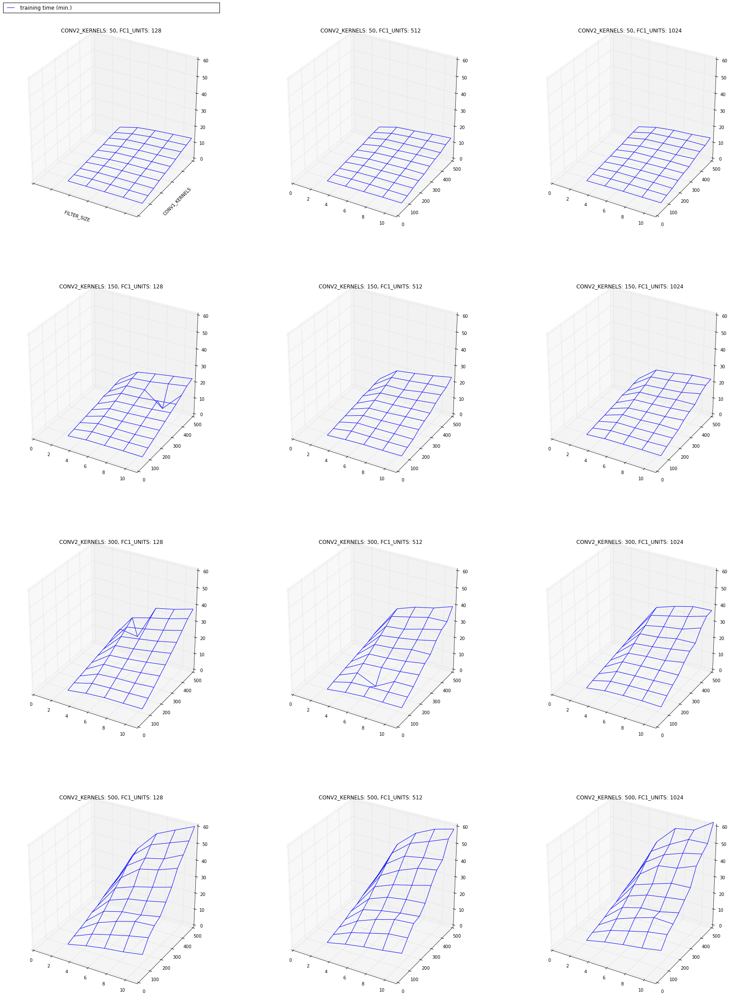

In [48]:
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV1_KERNELS", conv1_depths, \
             "FC1_UNITS", [128, 512, 1024], "CONV2_KERNELS", [50, 150, 300, 500], \
             "Test Error", postfix="partial", format='pdf')
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV1_KERNELS", conv1_depths, \
             "FC1_UNITS", [128, 512, 1024], "CONV2_KERNELS", [50, 150, 300, 500], \
             "Elapsed Time", postfix="partial", format='pdf')

In [ ]:
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV2_KERNELS", conv2_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV1_KERNELS", [50, 100, 150, 200, 250], \
             "Test Error", postfix="1")
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV2_KERNELS", conv2_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV1_KERNELS", [300, 350, 400, 450, 500],\
             "Test Error", postfix="2")
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV2_KERNELS", conv2_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV1_KERNELS", [50, 100, 150, 200, 250], \
             "Elapsed Time", postfix="1")
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV2_KERNELS", conv2_depths, \
             "FC1_UNITS", [128, 384, 512, 768, 1024], "CONV1_KERNELS", [300, 350, 400, 450, 500],\
             "Elapsed Time", postfix="2")

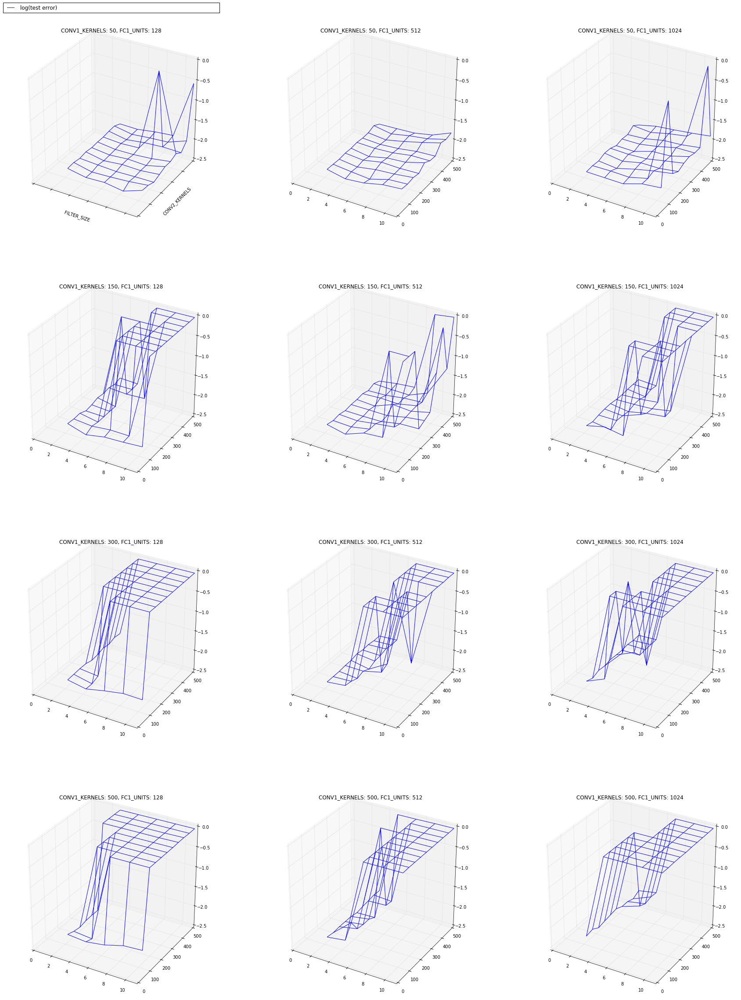

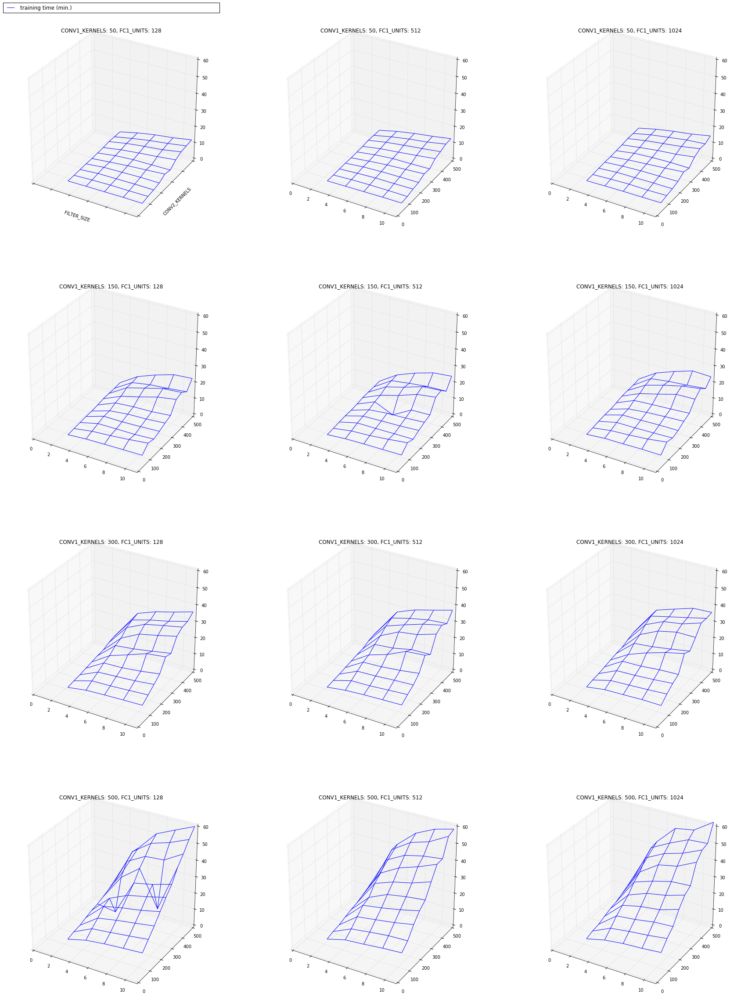

In [49]:
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV2_KERNELS", conv2_depths, \
             "FC1_UNITS", [128, 512, 1024], "CONV1_KERNELS", [50, 150, 300, 500], \
             "Test Error", postfix="partial", format='pdf')
draw_3dplots("FILTER_SIZE", filter_sizes, "CONV2_KERNELS", conv2_depths, \
             "FC1_UNITS", [128, 512, 1024], "CONV1_KERNELS", [50, 150, 300, 500], \
             "Elapsed Time", postfix="partial", format='pdf')

In [ ]:
draw_3dplots("FILTER_SIZE", filter_sizes, "FC1_UNITS", fc1_widths, \
             "CONV1_KERNELS", [50, 150, 250, 350, 450], "CONV2_KERNELS", [50, 100, 150, 200, 250], \
             "Test Error", postfix="1")
draw_3dplots("FILTER_SIZE", filter_sizes, "FC1_UNITS", fc1_widths, \
             "CONV1_KERNELS", [50, 150, 250, 350, 450], "CONV2_KERNELS", [300, 350, 400, 450, 500],\
             "Test Error", postfix="2")
draw_3dplots("FILTER_SIZE", filter_sizes, "FC1_UNITS", fc1_widths, \
             "CONV1_KERNELS", [50, 150, 250, 350, 450], "CONV2_KERNELS", [50, 100, 150, 200, 250], \
             "Elapsed Time", postfix="1")
draw_3dplots("FILTER_SIZE", filter_sizes, "FC1_UNITS", fc1_widths, \
             "CONV1_KERNELS", [50, 150, 250, 350, 450], "CONV2_KERNELS", [300, 350, 400, 450, 500],\
             "Elapsed Time", postfix="2")

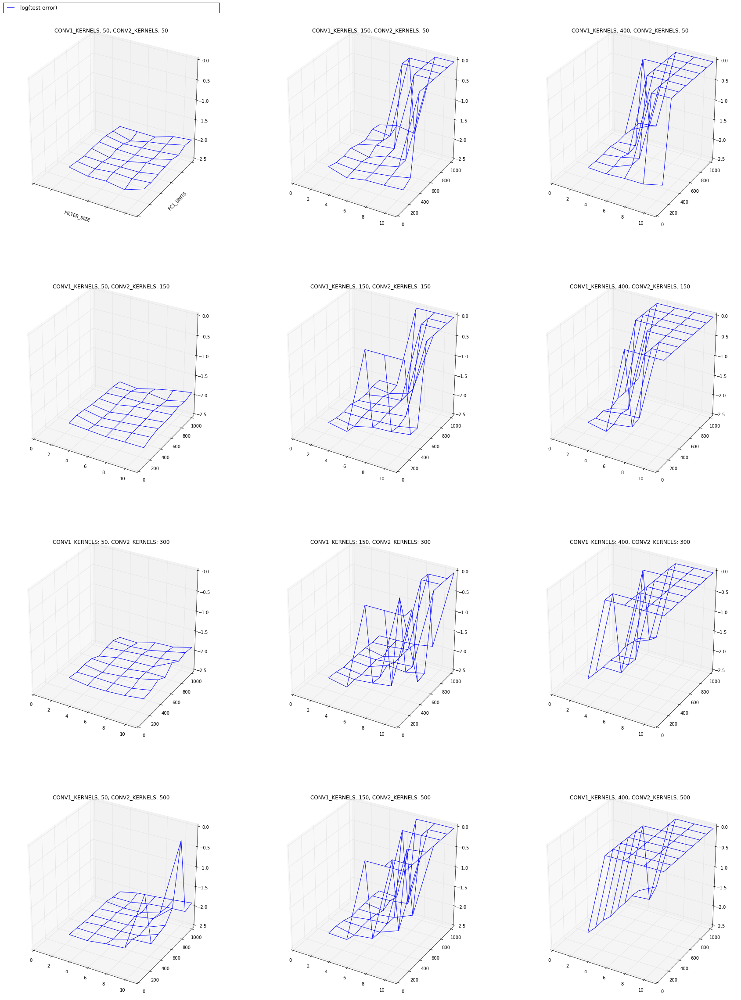

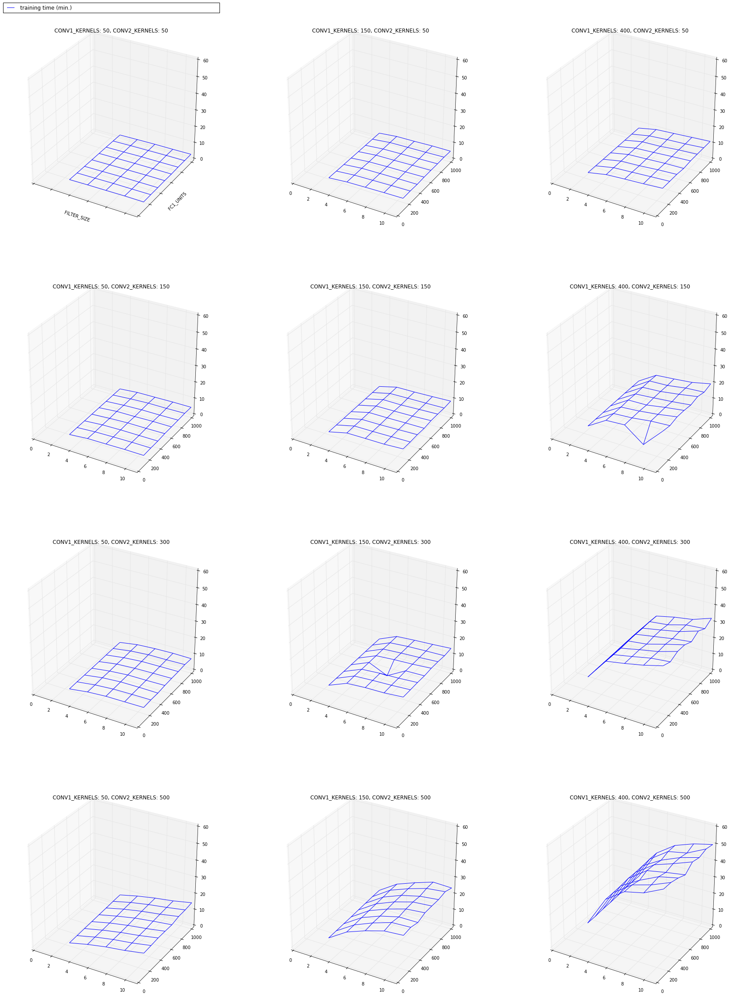

In [51]:
draw_3dplots("FILTER_SIZE", filter_sizes, "FC1_UNITS", fc1_widths, \
             "CONV1_KERNELS", [50, 150, 400], "CONV2_KERNELS", [50, 150, 300, 500],  \
             "Test Error", postfix="partial", format='pdf')
draw_3dplots("FILTER_SIZE", filter_sizes, "FC1_UNITS", fc1_widths, \
             "CONV1_KERNELS", [50, 150, 400], "CONV2_KERNELS", [50, 150, 300, 500],  \
             "Elapsed Time", postfix="partial", format='pdf')

In [65]:
merged_corr_table = pd.read_csv("../../log/correlation.csv", header=0)
merged_corr_table.head(5)

,Timestamp,Msec,Setting,Measure Type,Step,Epoch,Elapsed Time,Test Error,Validation Error,Training Error,BASE_LEARNING_RATE,CONV1_DEPTH,CONV2_DEPTH,DROPOUT_RATE,FC1_WIDTH,FILTER_SIZE,REGULARIZER_FACTOR
0,2016-11-29 21:08:16,206,/root/tf-hpolib/tf-hpo/src/.config/HPV_1480419...,epoch,859,1.0,8.15,0.8990,0.8922,NaN,0.1,50,50,0.25,896,3,0.00005
1,2016-11-29 21:08:16,230,/root/tf-hpolib/tf-hpo/src/.config/HPV_1480419...,epoch,859,1.0,8.17,0.8972,0.8960,NaN,0.1,50,50,0.75,896,3,0.02500
2,2016-11-29 21:08:16,233,/root/tf-hpolib/tf-hpo/src/.config/HPV_1480419...,epoch,859,1.0,8.17,0.8990,0.8922,NaN,0.1,50,50,0.75,896,3,0.00005
3,2016-11-29 21:08:20,990,/root/tf-hpolib/tf-hpo/src/.config/HPV_1480419...,epoch,1718,2.0,12.90,0.8972,0.8960,NaN,0.1,50,50,0.25,896,3,0.00005
4,2016-11-29 21:08:21,29,/root/tf-hpolib/tf-hpo/src/.config/HPV_1480419...,epoch,1718,2.0,13.00,0.9042,0.8974,NaN,0.1,50,50,0.75,896,3,0.02500


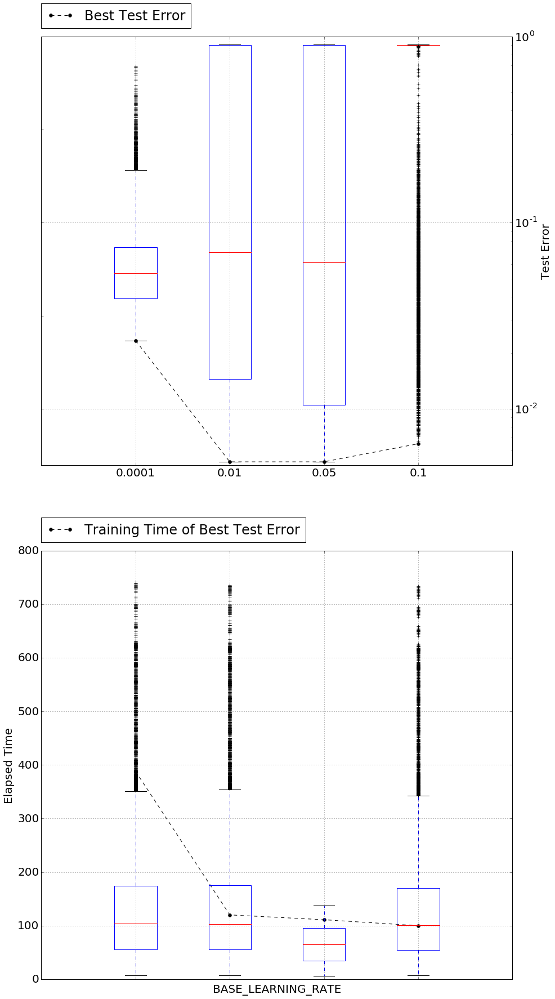

In [66]:
draw_summary_plot(merged_corr_table, "BASE_LEARNING_RATE", "When learning rate changes", "Test Error", figsize=(15, 30))

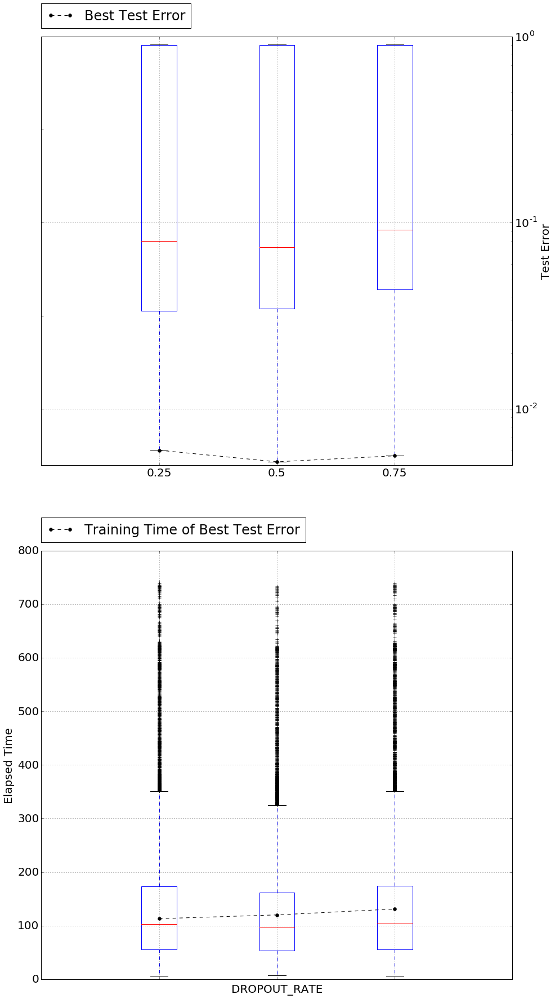

In [67]:
draw_summary_plot(merged_corr_table, "DROPOUT_RATE", "When dropout rate changes", "Test Error", figsize=(15, 30))

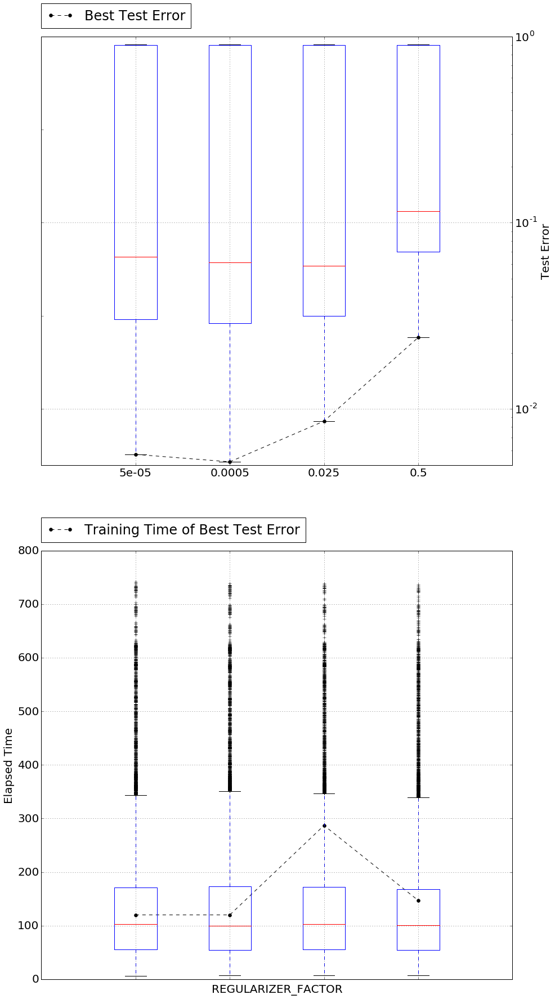

In [68]:
draw_summary_plot(merged_corr_table, "REGULARIZER_FACTOR", "When regularizer factor changes", "Test Error", figsize=(15, 30))

![alt text](Elapsed Time_3dplot_CONV1_KERNELS-CONV2_KERNELS-1.png "Title")